## Import Libraries

In [1]:
#Data Analysis & Data wrangling Libraries
import numpy as np
import pandas as pd
from collections import Counter
from functools import reduce
from datetime import datetime
from scipy import stats

# Standard plotly imports
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

#Visualization Librarues
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline

# Plot Style
sns.set_context("paper")
style.use('fivethirtyeight')

# Machine Learning Libraries

#Sci-kit learn libraries

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error


#statsmodel libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from pylab import rcParams

In [2]:
#Let import the datasets of all stocks 

## AVIATION STOCKS
American_Airlines = pd.read_csv("AAL.csv")

Alaska_Air = pd.read_csv("ALK.csv")

Hawaiian_Holdings = pd.read_csv("HA.csv")


## FINANCE STOCKS

Credit_Suisse = pd.read_csv("CS.csv")
Deutsche_Bank = pd.read_csv("DB.csv")
Goldman_Sachs = pd.read_csv("GS.csv")


## HEALTHCARE STOCKS
Johnson_and_Johnson = pd.read_csv("JNJ.csv")
Merck_and_CO = pd.read_csv("MRK.csv")

## PHARMACEUTICAL STOCKS
Bausch_Health = pd.read_csv("BHC.csv")


## TECHNOLOGY STOCKS
Apple = pd.read_csv("AAPL.csv")
Amazon = pd.read_csv("AMZN.csv")

Alphabet = pd.read_csv("GOOG.csv")


#s&p500 Index

SP500 = pd.read_csv("SP500.csv")

In [3]:
#display first 10 records of the dataframe ad
American_Airlines.head(10)


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,9.29,9.39,9.21,9.29,8.758067,3603800
1,04-10-2010,9.24,9.48,9.05,9.12,8.597802,3856800
2,05-10-2010,9.27,9.35,9.15,9.23,8.701504,3896600
3,06-10-2010,9.27,9.40,9.15,9.23,8.701504,3230200
4,07-10-2010,9.30,9.31,9.07,9.24,8.710930,3877700
5,08-10-2010,9.22,9.26,9.00,9.07,8.550665,4455700
6,11-10-2010,9.06,9.16,9.00,9.00,8.484673,2231500
7,12-10-2010,9.02,9.57,8.94,9.55,9.003184,10884900
8,13-10-2010,9.67,9.90,9.65,9.80,9.238865,7754800
9,14-10-2010,9.76,9.81,9.62,9.78,9.220010,3760500


In [4]:
#Renaming the columns in the dataset and changing the close column to the stock name for easy reference

American_Airlines = American_Airlines.rename(columns = {'Open': 'AAL_Open', 'High': 'AAL_High','Low': 'AAL_Low','Close': 'AAL','Adj Close': 'AAL_Adj Close','Volume': 'AAL_Volume'}, inplace = False)

Alaska_AirLk = Alaska_Air.rename(columns = {'Open': 'ALk_Open', 'High': 'ALk_High','Low': 'ALk_Low','Close': 'ALk','Adj Close': 'ALk_Adj Close','Volume': 'ALk_Volume'}, inplace = False)

Hawaiian_Holdings = Hawaiian_Holdings.rename(columns = {'Open': 'HA_Open', 'High': 'HA_High','Low': 'HA_Low','Close': 'HA','Adj Close': 'HAL_Adj Close','Volume': 'HAL_Volume'}, inplace = False)


Credit_Suisse = Credit_Suisse.rename(columns = {'Open': 'CS_Open', 'High': 'CS_High','Low': 'CS_Low','Close': 'CS','Adj Close': 'CS_Adj Close','Volume': 'CS_Volume'}, inplace = False)
Deutsche_Bank= Deutsche_Bank.rename(columns = {'Open': 'DB_Open', 'High': 'DB_High','Low': 'DB_Low','Close': 'DB','Adj Close': 'DB_Adj Close','Volume': 'DB_Volume'}, inplace = False)
Goldman_Sachs = Goldman_Sachs.rename(columns = {'Open': 'GS_Open', 'High': 'GS_High','Low': 'GS_Low','Close': 'GS','Adj Close': 'GS_Adj Close','Volume': 'GS_Volume'}, inplace = False)

Johnson_and_Johnson = Johnson_and_Johnson.rename(columns = {'Open': 'JNJ_Open', 'High': 'JNJ_High','Low': 'JNJ_Low','Close': 'JNJ','Adj Close': 'JNJ_Adj Close','Volume': 'JNJ_Volume'}, inplace = False)
Merck_and_CO = Merck_and_CO.rename(columns = {'Open': 'MRK_Open', 'High': 'MRK_High','Low': 'MRK_Low','Close': 'MRK','Adj Close': 'MRK_Adj Close','Volume': 'MRK_Volume'}, inplace = False)

Bausch_Health = Bausch_Health.rename(columns = {'Open': 'BHC_Open', 'High': 'BHC_High','Low': 'BHC_Low','Close': 'BHC','Adj Close': 'BHC_Adj Close','Volume': 'BHC_Volume'}, inplace = False)

Apple = Apple.rename(columns = {'Open': 'AAPL_Open', 'High': 'AAPL_High','Low': 'AAPL_Low','Close': 'AAPL','Adj Close': 'AAPL_Adj Close','Volume': 'AAPL_Volume'}, inplace = False)
Amazon = Amazon.rename(columns = {'Open': 'AMZN_Open', 'High': 'AMZN_High','Low': 'AMZN_Low','Close': 'AMZN','Adj Close': 'AMZN_Adj Close','Volume': 'AMZN_Volume'}, inplace = False)
Alphabet = Alphabet.rename(columns = {'Open': 'GOOG_Open', 'High': 'GOOG_High','Low': 'GOOG_Low','Close': 'GOOG','Adj Close': 'GOOG_Adj Close','Volume': 'GOOG_Volume'}, inplace = False)

SP500 = SP500.rename(columns = {'Open': 'S&P500_Open', 'High': 'S&P500_High','Low': 'S&P500_Low','Close': 'S&P500','Adj Close': 'S&P500_Adj Close','Volume': 'S&P500_Volume'}, inplace = False)


In [5]:
# here we are creating the new subsets from the data to do the further processing

# S&P500 index
SP500 = SP500[['Date','S&P500']]

# Aviation stocks
AAL = American_Airlines[['Date','AAL']]

ALK = Alaska_AirLk[['Date','ALk']]

HA = Hawaiian_Holdings[['Date','HA']]


# Finance stocks

CS = Credit_Suisse[['Date','CS']]
DB = Deutsche_Bank[['Date','DB']]
GS = Goldman_Sachs[['Date','GS']]


# Pharma_healthcare stocks
BHC = Bausch_Health[['Date','BHC']]
JNJ = Johnson_and_Johnson[['Date','JNJ']]
MRK = Merck_and_CO[['Date','MRK']]

# Technology stocks
AAPL = Apple[['Date','AAPL']]
AMZN = Amazon[['Date','AMZN']]

GOOG = Alphabet[['Date','GOOG']]


In [6]:
# Lets merge the subsets of the data into a common dataset
data = pd.merge(SP500, AAL, how='inner', on='Date')
data = pd.merge(data, ALK, how='inner', on='Date')
data = pd.merge(data, HA, how='inner', on='Date')

data = pd.merge(data, CS, how='inner', on='Date')
data = pd.merge(data, DB, how='inner', on='Date')
data = pd.merge(data, GS, how='inner', on='Date')

data = pd.merge(data, BHC, how='inner', on='Date')
data = pd.merge(data, JNJ, how='inner', on='Date')
data = pd.merge(data, MRK, how='inner', on='Date')

data = pd.merge(data, AAPL, how='inner', on='Date')
data = pd.merge(data, AMZN, how='inner', on='Date')
data = pd.merge(data, GOOG, how='inner', on='Date')


In [7]:
data.head(10)

,Date,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
0,01-10-2010,1146.239990,9.29,12.4475,5.96,42.226563,52.595421,147.699997,25.750000,61.750000,36.599998,10.090000,153.710007,261.828613
1,04-10-2010,1137.030029,9.12,12.1425,5.75,41.914063,51.755726,146.570007,25.870001,61.669998,36.520000,9.951428,155.389999,260.199707
2,05-10-2010,1160.750000,9.23,12.2150,5.85,43.154297,53.950382,149.570007,26.299999,62.799999,37.020000,10.319285,160.869995,268.110046
3,06-10-2010,1159.969971,9.23,12.1875,5.97,43.437500,54.608780,150.839996,26.690001,63.209999,37.009998,10.328215,155.399994,266.177307
4,07-10-2010,1158.060059,9.24,11.6250,6.15,43.671875,54.036259,151.110001,26.600000,63.220001,36.709999,10.329286,156.270004,264.015411
5,08-10-2010,1165.150024,9.07,12.0475,6.15,42.988281,53.874046,152.660004,26.840000,63.230000,36.910000,10.502500,155.550003,267.173553
6,11-10-2010,1165.319946,9.00,11.7550,6.11,43.349609,53.587788,152.199997,27.160000,63.299999,36.860001,10.548572,153.029999,268.413910
7,12-10-2010,1169.770020,9.55,11.8300,6.35,43.486328,53.339695,155.210007,27.879999,63.290001,36.639999,10.662143,156.479996,269.684143
8,13-10-2010,1178.099976,9.80,11.8850,6.39,43.945313,55.066795,154.729996,27.860001,63.580002,37.160000,10.719286,155.169998,270.635590
9,14-10-2010,1173.810059,9.78,11.8450,6.32,43.554688,54.856869,151.589996,27.290001,63.740002,37.150002,10.796785,155.529999,269.455017


In [8]:
#Lets check the database dimension
print("Database dimension     :",data.shape)
print("Number of Row          :",len(data.index))
print("Number of Columns      :",len(data.columns))

Database dimension     : (2517, 14)
Number of Row          : 2517
Number of Columns      : 14


In [9]:
#Lets check the numerical columns statistics
data.describe()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,2111.392732,29.397636,50.031176,22.870413,21.501379,27.304930,179.598184,61.880687,105.277378,57.161053,33.454670,854.636107,730.426139
std,612.227235,15.211889,24.187020,15.483034,8.988043,15.409974,42.405475,57.170002,28.174233,15.164505,20.630118,745.201139,364.685720
min,1099.229980,4.000000,11.620000,3.780000,6.670000,5.480000,87.699997,8.510000,57.660000,29.809999,9.951428,153.029999,236.553345
25%,1562.170044,13.010000,26.780001,7.030000,13.740000,13.470000,154.990005,22.170000,81.930000,45.730000,18.961428,266.489990,403.642059
50%,2071.219971,32.520000,58.540001,21.910000,19.639999,28.370001,177.229996,38.759998,104.040001,57.180000,27.592501,533.750000,651.789978
75%,2656.300049,42.200001,67.260002,36.900002,27.750000,41.049618,211.580002,90.269997,130.979996,64.089996,42.962502,1500.000000,1055.810059
max,3580.840088,58.470001,100.239998,60.299999,46.513672,62.624046,273.380005,262.519989,155.509995,92.040001,134.179993,3531.449951,1728.280029


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2517 non-null   object 
 1   S&P500  2517 non-null   float64
 2   AAL     2517 non-null   float64
 3   ALk     2517 non-null   float64
 4   HA      2517 non-null   float64
 5   CS      2517 non-null   float64
 6   DB      2517 non-null   float64
 7   GS      2517 non-null   float64
 8   BHC     2517 non-null   float64
 9   JNJ     2517 non-null   float64
 10  MRK     2517 non-null   float64
 11  AAPL    2517 non-null   float64
 12  AMZN    2517 non-null   float64
 13  GOOG    2517 non-null   float64
dtypes: float64(13), object(1)
memory usage: 275.4+ KB


In [11]:
data.dtypes

Date       object
S&P500    float64
AAL       float64
ALk       float64
HA        float64
CS        float64
DB        float64
GS        float64
BHC       float64
JNJ       float64
MRK       float64
AAPL      float64
AMZN      float64
GOOG      float64
dtype: object

As we can see that the date datatype is object, we need to change it to date format 

In [12]:
# lets change the date column to datetime format
data["Date"]= pd.to_datetime(data["Date"], format='%d-%m-%Y')

#display data types of the column in dataframe ad
data.dtypes

Date      datetime64[ns]
S&P500           float64
AAL              float64
ALk              float64
HA               float64
CS               float64
DB               float64
GS               float64
BHC              float64
JNJ              float64
MRK              float64
AAPL             float64
AMZN             float64
GOOG             float64
dtype: object

In [13]:
#lets convert the datecolumn as index for our reference
data = data.set_index('Date')

#lets check the data columnn
data.head()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
Date,,,,,,,,,,,,,
2010-10-01,1146.239990,9.29,12.4475,5.96,42.226563,52.595421,147.699997,25.750000,61.750000,36.599998,10.090000,153.710007,261.828613
2010-10-04,1137.030029,9.12,12.1425,5.75,41.914063,51.755726,146.570007,25.870001,61.669998,36.520000,9.951428,155.389999,260.199707
2010-10-05,1160.750000,9.23,12.2150,5.85,43.154297,53.950382,149.570007,26.299999,62.799999,37.020000,10.319285,160.869995,268.110046
2010-10-06,1159.969971,9.23,12.1875,5.97,43.437500,54.608780,150.839996,26.690001,63.209999,37.009998,10.328215,155.399994,266.177307
2010-10-07,1158.060059,9.24,11.6250,6.15,43.671875,54.036259,151.110001,26.600000,63.220001,36.709999,10.329286,156.270004,264.015411


In [14]:
# here we need to analyse the data for last 5 years and predict for next 5 years
# i.e. as the client is looking for an investment period of 5 years
data = data['10-01-2015':]
data.head()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
Date,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,80.230003,24.730000,24.090000,26.520000,176.020004,179.600006,93.169998,49.369999,27.395000,520.719971,611.289978
2015-10-02,1951.359985,38.630001,79.260002,24.280001,24.639999,27.139999,177.009995,182.320007,93.930000,50.139999,27.594999,532.539978,626.909973
2015-10-05,1987.050049,40.189999,80.910004,25.500000,25.160000,28.200001,180.699997,163.460007,94.760002,51.230000,27.695000,543.679993,641.469971
2015-10-06,1979.920044,38.130001,74.529999,24.250000,25.379999,28.400000,180.320007,166.000000,93.419998,49.799999,27.827499,537.479980,645.440002
2015-10-07,1995.829956,39.310001,75.970001,24.559999,25.320000,28.790001,182.229996,169.830002,94.980003,50.950001,27.695000,541.940002,642.359985


### Null value calculation


In [15]:
data.isnull().sum()

S&P500    0
AAL       0
ALk       0
HA        0
CS        0
DB        0
GS        0
BHC       0
JNJ       0
MRK       0
AAPL      0
AMZN      0
GOOG      0
dtype: int64

In [16]:
#Column wise null values in train data set 
null_perc = pd.DataFrame(round((data.isnull().sum())*100/data.shape[0],2)).reset_index()
null_perc.columns = ['Column Name', 'Null Values Percentage']
null_value = pd.DataFrame(data.isnull().sum()).reset_index()
null_value.columns = ['Column Name', 'Null Values']
null_data = pd.merge(null_value, null_perc, on='Column Name')
null_data.sort_values("Null Values", ascending = False)

,Column Name,Null Values,Null Values Percentage
0,S&P500,0,0.0
1,AAL,0,0.0
2,ALk,0,0.0
3,HA,0,0.0
4,CS,0,0.0
5,DB,0,0.0
6,GS,0,0.0
7,BHC,0,0.0
8,JNJ,0,0.0
9,MRK,0,0.0


In [17]:
Row_Null40_Count = len(data[data.isnull().sum(axis=1)/data.shape[1]>0.40])
print( 'Total number of rows with more than 40% null values are : ', Row_Null40_Count)

Total number of rows with more than 40% null values are :  0


In [18]:
#Lets export the cleaned dataset in CSV format
data.to_csv('Final_Cleaned_Dataset.csv')

# EDA

## Data Normalization

In [19]:
# lets assign the dataset to Nomalized data to do the normalization
normalized_data = data.copy()

# Here we are using the Minmax Scaler...The default range for the feature returned by MinMaxScaler is 0 to 1.
scaler = MinMaxScaler()

# here we are calculating the values and appling the values of the parameters on the actual data and gives the normalized value
scaled =scaler.fit_transform(normalized_data.iloc[:])

# reassigning the tranformed dataset to Normalized_data
normalized_data.iloc[:]=scaled

In [20]:
normalized_data.head()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
Date,,,,,,,,,,,,,
2015-10-01,0.054083,0.610156,0.739045,0.311593,0.903059,0.832608,0.296583,0.984351,0.000000,0.017952,0.043102,0.012675,0.000000
2015-10-02,0.069804,0.598624,0.726395,0.302884,0.931571,0.857143,0.303735,1.000000,0.012191,0.035673,0.044894,0.016551,0.013984
2015-10-05,0.090178,0.630184,0.747913,0.326495,0.958528,0.899090,0.330395,0.891491,0.025505,0.060759,0.045791,0.020204,0.027019
2015-10-06,0.086108,0.588509,0.664710,0.302303,0.969933,0.907004,0.327650,0.906104,0.004010,0.027848,0.046978,0.018171,0.030573
2015-10-07,0.095190,0.612381,0.683490,0.308303,0.966822,0.922438,0.341449,0.928140,0.029034,0.054315,0.045791,0.019633,0.027816


## Data Visualization

It is always good to visualize the data to better understand the stocks performance.

We will use the interactive library plotly.express for this exercise. This library allows us to interact with the graph: zooming in and out, adding/removing a plot line, saving as image and more.

In [21]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph
def visualize(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[1:]:
        fig.add_trace(
            go.Scatter(
                x = data.index,
                y = data[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[1:].isin(data.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[1:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Actual Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()


In [22]:
# lets check the visualization of the stocks without normalization
visualize(data)

In [23]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are adding the first column S&P500 to check the stocks against the market index

# lets define the function to plot the graph
def visualize1(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[:]:
        fig.add_trace(
            go.Scatter(
                x = data.index,
                y = data[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[:].isin(data.columns.to_list()[:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Normalized Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()

In [24]:
# lets visualize the normalized stocks
visualize1(normalized_data)

### Insight:
 
At the end of 5 years we can see that the 5 stocks having returns of greater than 80%

# Sector wise analysis

## Aviation Sector

In [25]:
#Aviation Stocks

Aviation=normalized_data[['S&P500','AAL','ALk','HA']]

Aviation.head()

,S&P500,AAL,ALk,HA
Date,,,,
2015-10-01,0.054083,0.610156,0.739045,0.311593
2015-10-02,0.069804,0.598624,0.726395,0.302884
2015-10-05,0.090178,0.630184,0.747913,0.326495
2015-10-06,0.086108,0.588509,0.664710,0.302303
2015-10-07,0.095190,0.612381,0.683490,0.308303


In [26]:
#lets Visualize the stocks against the same industry along with market index

visualize1(Aviation)

### Insight:

- Aviation Sector has faced major crisis in March 2020 due to Corona Pandemic and the aviation sector has not recovered there after even though the market index has gone up.

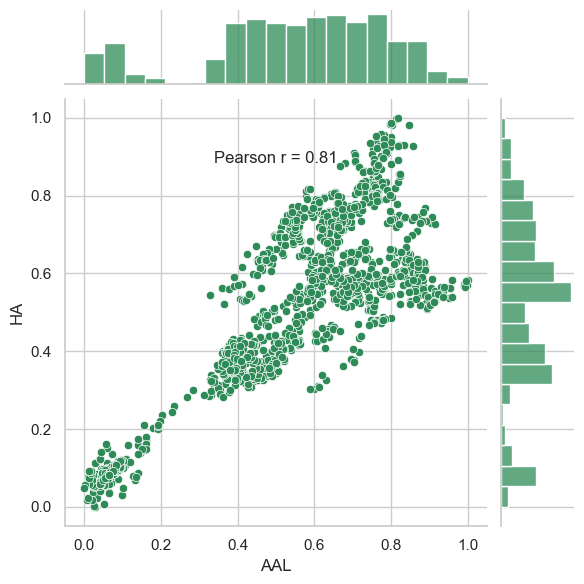

In [27]:
sns.set(style="whitegrid")
joint = sns.jointplot(x='AAL', y='HA', data=Aviation, kind='scatter', color='seagreen')

# Calculate Pearson correlation coefficient
r, p_value = stats.pearsonr(Aviation['AAL'], Aviation['HA'])

# Annotate plot with Pearson correlation coefficient
joint.ax_joint.annotate(f"Pearson r = {r:.2f}", xy=(0.5, 0.85), xycoords='axes fraction', ha='center', fontsize=12)

plt.show()


We can see that pearson coefficint = 0.81.If p value is close to 1 it mease higher positive correlation.If the p values is close to -1 then it means the stock prices have a higher negative correlation.

So we can conclude that HA and ALGT stock prices have high positive correlation.

## Finance Sector

In [28]:
# Finance Stocks

Finance=normalized_data[['S&P500','CS','DB','GS']]

Finance.head()

,S&P500,CS,DB,GS
Date,,,,
2015-10-01,0.054083,0.903059,0.832608,0.296583
2015-10-02,0.069804,0.931571,0.857143,0.303735
2015-10-05,0.090178,0.958528,0.899090,0.330395
2015-10-06,0.086108,0.969933,0.907004,0.327650
2015-10-07,0.095190,0.966822,0.922438,0.341449


In [29]:
#lets Visualize the stocks against the same industry along with market index

visualize1(Finance)

### Insight:

- Finance Sector has also faced crisis in March 2020 due to Corona Pandemic and the majority of stocks has been hit.


- Goldman Sachs have performed well when compared to other stocks

/Users/sambhavjain/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



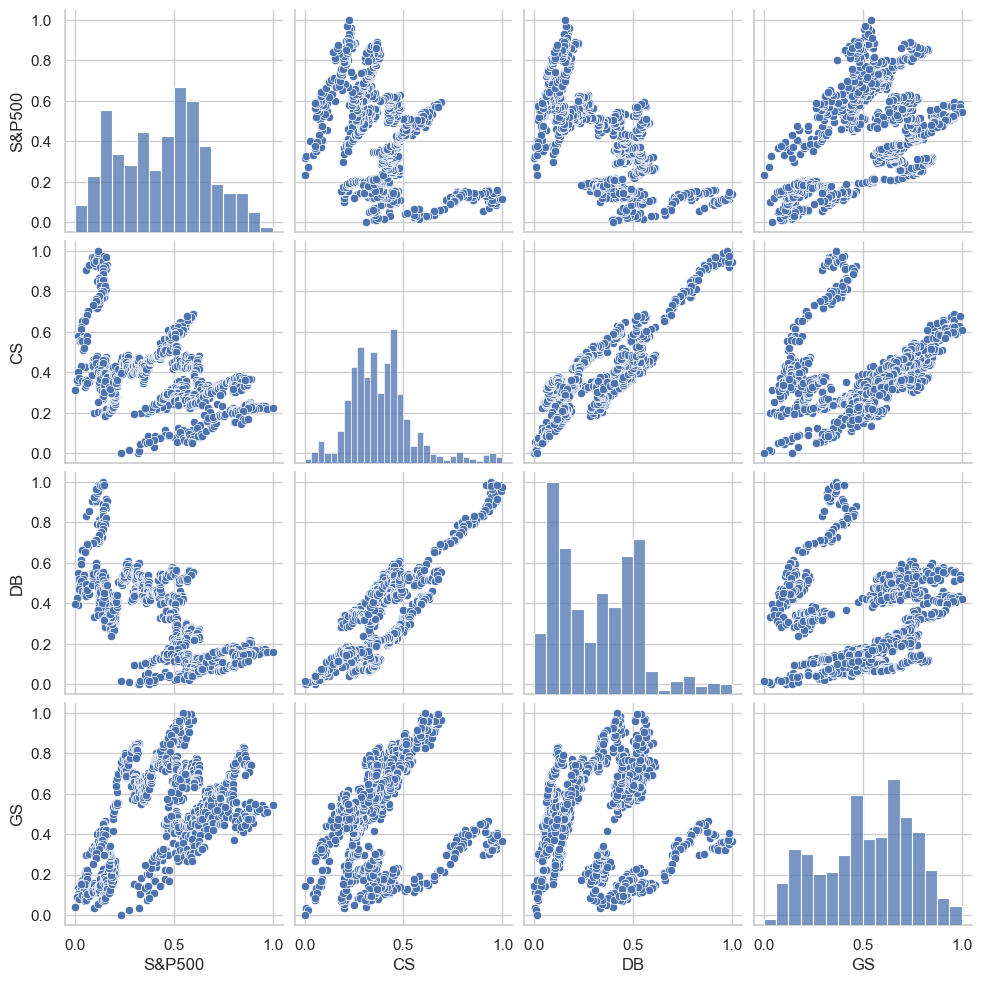

In [30]:
sns.pairplot(Finance, kind = 'scatter')
plt.ioff()

Here we can see that Deutsche Bank & Credit Suisse stanley are highly correlated when compared to others stocks

# Pharma Sector

In [31]:
#pharma & healthcare stocks

Pharma=normalized_data[['S&P500','BHC','JNJ','MRK']]

Pharma.head()

,S&P500,BHC,JNJ,MRK
Date,,,,
2015-10-01,0.054083,0.984351,0.000000,0.017952
2015-10-02,0.069804,1.000000,0.012191,0.035673
2015-10-05,0.090178,0.891491,0.025505,0.060759
2015-10-06,0.086108,0.906104,0.004010,0.027848
2015-10-07,0.095190,0.928140,0.029034,0.054315


In [32]:
#lets Visualize the stocks against the same industry along with market index

visualize1(Pharma)

### Insight:

- Pharma & Health care Sector has performed good except for the Baush health even after taking a hit from the corona pandemic


- Merck and CO inc., Johnson & Johsnson have performed well when compared to S&P Index.


- Bausch Helath is consistently performed very badly over the years when compared to other stocks in the same sector.

In [33]:
sns.pairplot(Pharma, kind = 'scatter')
plt.ioff()

/Users/sambhavjain/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



# Technology Sector

In [34]:
# Technology Stocks

Technology = normalized_data[['S&P500','AAPL','AMZN','GOOG']]

Technology.tail()

,S&P500,AAPL,AMZN,GOOG
Date,,,,
2020-09-24,0.809192,0.767373,0.832209,0.731430
2020-09-25,0.838802,0.803755,0.856915,0.746354
2020-09-28,0.869137,0.827770,0.882796,0.763865
2020-09-29,0.859929,0.819974,0.873230,0.768172
2020-09-30,0.875645,0.835387,0.874493,0.768413


In [35]:
#lets Visualize the stocks against the same industry along with market index
visualize1(Technology)

### Insight:

- Technology Sector has also faced crisis in March 2020 due to Covid Pandemic but the recovery rate shown by this sector is commendable.


-  Amazon & Apple have performed well along with Market index.


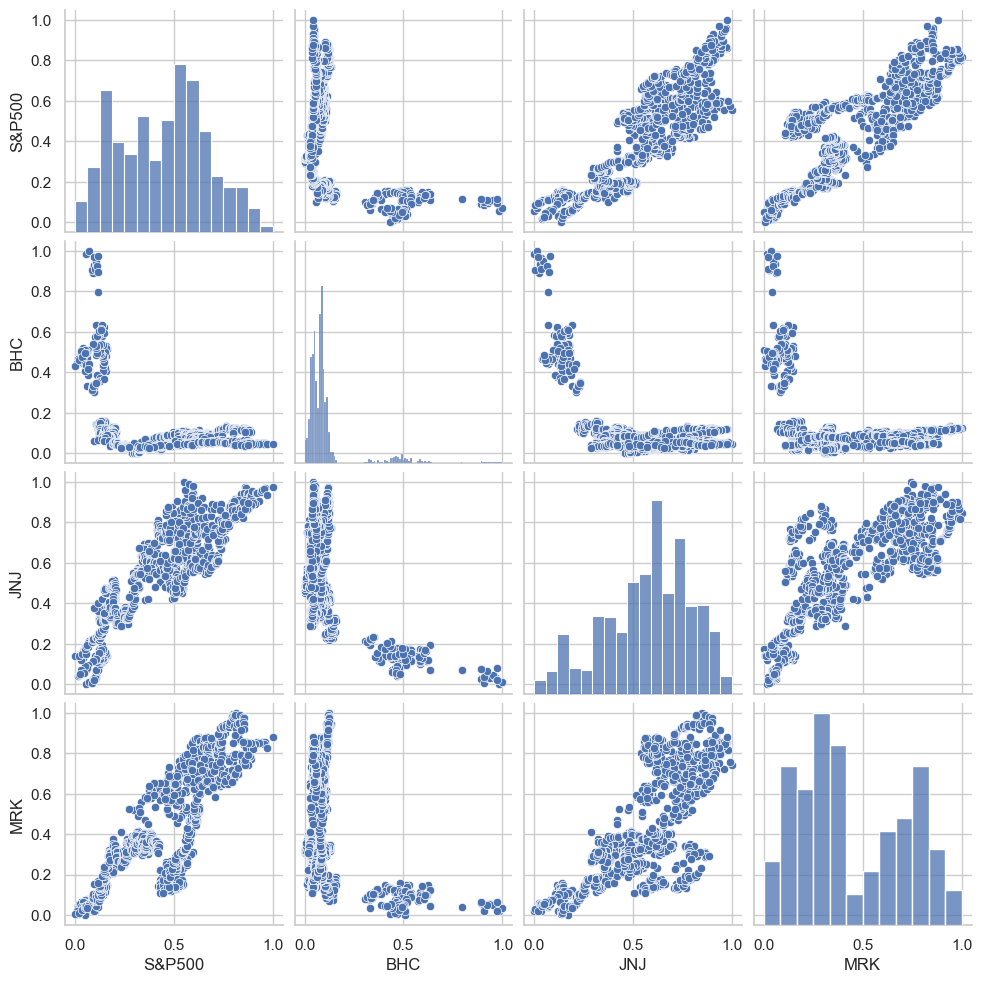

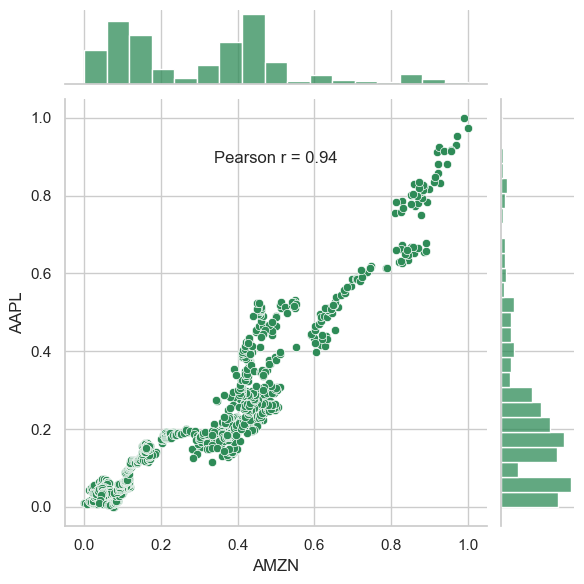

In [36]:
sns.set(style="whitegrid")
joint = sns.jointplot(x='AMZN', y='AAPL', data=Technology, kind='scatter', color='seagreen')

# Calculate Pearson correlation coefficient
r, p_value = stats.pearsonr(Technology['AMZN'], Technology['AAPL'])

# Annotate plot with Pearson correlation coefficient
joint.ax_joint.annotate(f"Pearson r = {r:.2f}", xy=(0.5, 0.85), xycoords='axes fraction', ha='center', fontsize=12)

plt.show()

/Users/sambhavjain/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



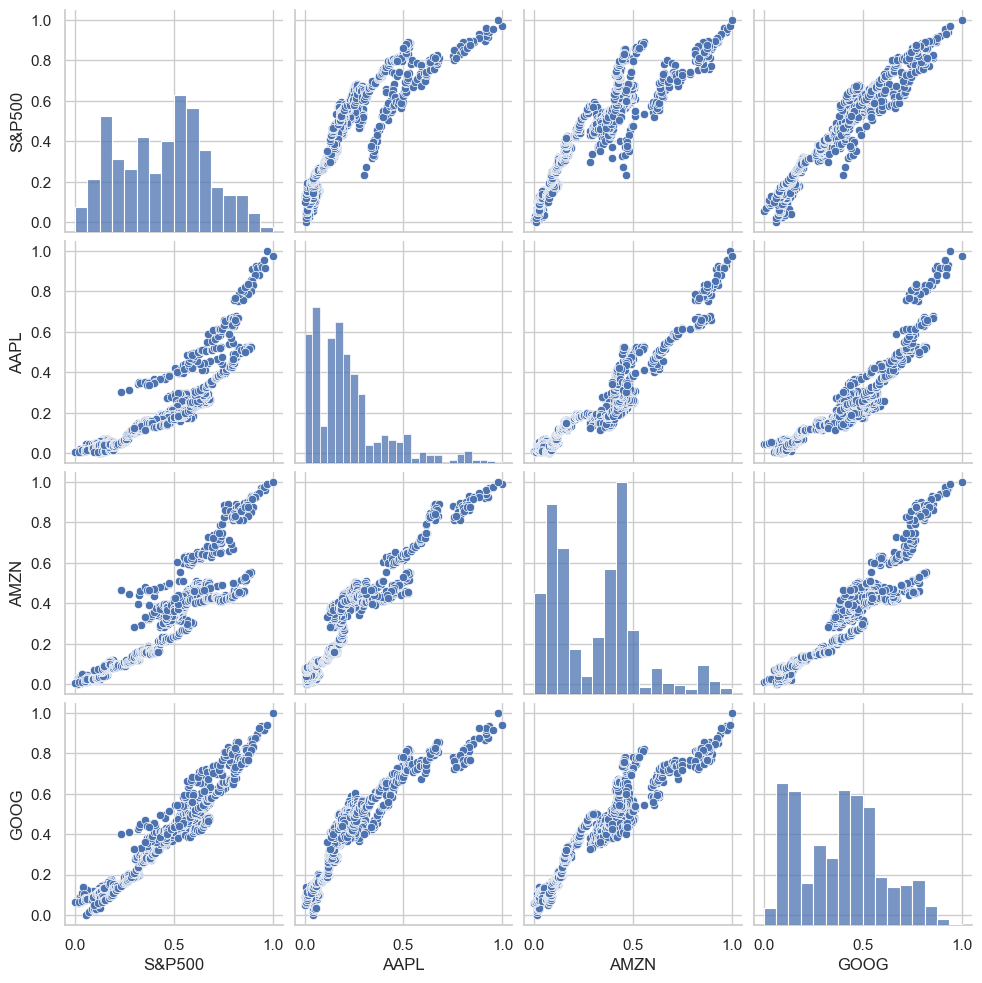

In [37]:
sns.pairplot(Technology, kind = 'scatter')
plt.show()

We can see that pearson coefficint = 0.94.If p value is close to 1 it mease higher positive correlation.If the p values is close to -1 then it means the stock prices have a higher negative correlation.So we can conclude that Apple and Amazon stock prices have high positive correlation.

## Daily Returns

A return, also known as a financial return, in its simplest terms, is the money made or lost on an investment over some period of time.

- A return is a percentage defined as the change of price expressed as a fraction of the initial price.

- Returns exhibit more attractive statistical properties than asset prices themselves. Therefore it also makes more statistical sense to analyze return data rather than price series.

We will use formula and pandas built in function pct_change to compute the simple returns for each day, each stock in our dataset.

In [38]:
# lets assign the dataset to daily_returns
daily_returns = data.copy()

# using a loop function to calculate the percentage change

for i in list(daily_returns.columns[:]):
    daily_returns[i]=daily_returns[i].pct_change(1)  # Percentage change between the current and a prior element

In [39]:
visualize(daily_returns)

In [40]:
#lets see the correaltion for the daily returns
correlated_data = daily_returns.corr(method='pearson')

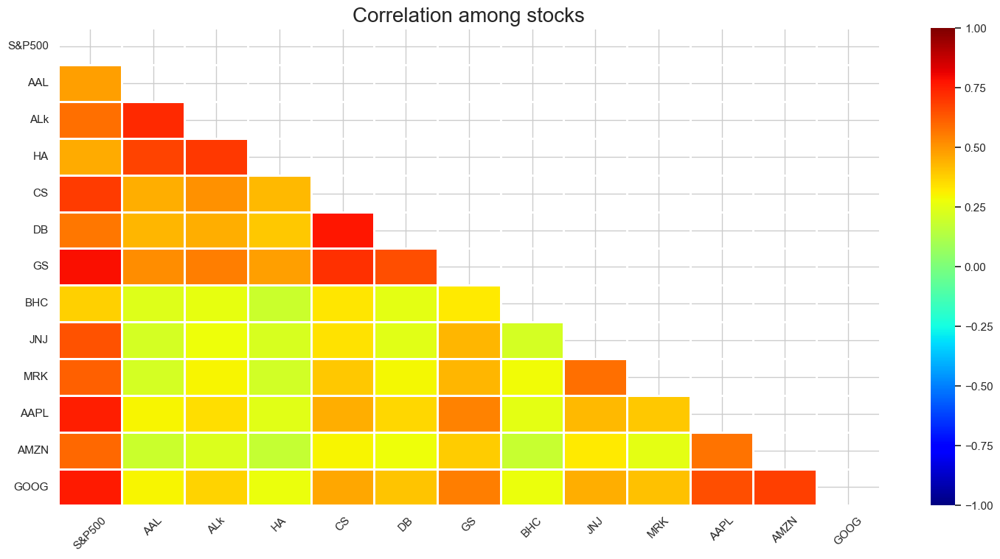

In [41]:
#Lets plot the heatmap
plt.figure(figsize=(16,8))
mask = np.zeros_like(correlated_data)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlated_data, cmap='jet', vmax=1.0, vmin=-1.0 , mask = mask, linewidths=1.0)
plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Correlation among stocks', fontsize = 20)
plt.show()

From the above Graph we can see that 
- AMZN & GOOG, GOOG & AAPL are correlated in the Techonolgy Stocks
- CS & DB, CS & GS are highly correlated in the Finance Stocks
- AAl & ALK, AAL & HA, ALK & HA are more correlated in the Aviation stocks
- Pharma stocks are less correlated when comapred to any other sector stocks

In [42]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph

def dispersion_plot(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[1:]:
        fig.add_trace(
            go.Histogram(
                x = data[column],
                name = column
            )
            
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[1:].isin(data.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[1:].map(lambda column: stocks_layout_button(column)))
            )
        ])
    
# defining a slider option to increase or decrease the time period       
    fig.update_layout(title_text="Stock Price Dispersion from Mean",
                  xaxis_rangeslider_visible=True)
    fig.show()

    
#lets plot the graph
dispersion_plot(daily_returns)

We can see that most of the Daily returns value is centred around zero.

# Cumulative Daily Returns

In [43]:
# Lets Calculate the cumulative daily returns
df_cum_daily_returns = (1 + daily_returns).cumprod() - 1

df_cum_daily_returns.tail()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
Date,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.555029,-0.498585,-0.600664,-0.694193,0.108454,-0.915256,0.552753,0.684221,2.950356,4.799259,1.336518
2020-09-25,0.714537,-0.686480,-0.542565,-0.482410,-0.606476,-0.698341,0.107545,-0.914811,0.563379,0.679765,3.098558,4.943943,1.363788
2020-09-28,0.742159,-0.674490,-0.532095,-0.458957,-0.589041,-0.682127,0.130951,-0.914978,0.578942,0.676322,3.196386,5.095503,1.395786
2020-09-29,0.733775,-0.687500,-0.542939,-0.479984,-0.591947,-0.688160,0.117998,-0.917149,0.578405,0.658902,3.164628,5.039484,1.403655
2020-09-30,0.748085,-0.686480,-0.543438,-0.478771,-0.586135,-0.683258,0.141745,-0.913474,0.597939,0.680170,3.227414,5.046878,1.404096


In [44]:
# Since we calculated returns the first row for Returns and CumReturns will be null
# Delete the null rows as they are not relevant for our calculations

daily_returns.dropna(axis = 0, inplace = True)
df_cum_daily_returns.dropna(axis = 0, inplace = True)

In [45]:
#Lets check the null row has been removed or not
daily_returns.head()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
Date,,,,,,,,,,,,,
2015-10-02,0.014315,-0.014541,-0.012090,-0.018196,0.022831,0.023379,0.005624,0.015145,0.008157,0.015597,0.007301,0.022699,0.025553
2015-10-05,0.018290,0.040383,0.020818,0.050247,0.021104,0.039057,0.020846,-0.103444,0.008836,0.021739,0.003624,0.020919,0.023225
2015-10-06,-0.003588,-0.051256,-0.078853,-0.049020,0.008744,0.007092,-0.002103,0.015539,-0.014141,-0.027913,0.004784,-0.011404,0.006189
2015-10-07,0.008036,0.030947,0.019321,0.012783,-0.002364,0.013732,0.010592,0.023072,0.016699,0.023092,-0.004761,0.008298,-0.004772
2015-10-08,0.008818,0.010939,-0.002764,0.062296,-0.031201,-0.013894,-0.006366,0.007890,0.001053,0.001374,-0.011554,-0.016201,-0.004982


In [46]:
df_cum_daily_returns.tail()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
Date,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.555029,-0.498585,-0.600664,-0.694193,0.108454,-0.915256,0.552753,0.684221,2.950356,4.799259,1.336518
2020-09-25,0.714537,-0.686480,-0.542565,-0.482410,-0.606476,-0.698341,0.107545,-0.914811,0.563379,0.679765,3.098558,4.943943,1.363788
2020-09-28,0.742159,-0.674490,-0.532095,-0.458957,-0.589041,-0.682127,0.130951,-0.914978,0.578942,0.676322,3.196386,5.095503,1.395786
2020-09-29,0.733775,-0.687500,-0.542939,-0.479984,-0.591947,-0.688160,0.117998,-0.917149,0.578405,0.658902,3.164628,5.039484,1.403655
2020-09-30,0.748085,-0.686480,-0.543438,-0.478771,-0.586135,-0.683258,0.141745,-0.913474,0.597939,0.680170,3.227414,5.046878,1.404096


Last record of the dataframe multiplied by 100 is giving us the percentage change of the stock prices for our entire period

In [47]:
#selecting the last row and assigning it to a data frame
Cum_daily_returns = df_cum_daily_returns.iloc[:, :].tail(1)

# lets round off the values by mulitplying with 100
Cum_daily_returns = Cum_daily_returns * 100

# lets check the dataframe
Cum_daily_returns

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
Date,,,,,,,,,,,,,
2020-09-30,74.808459,-68.64796,-54.343762,-47.877072,-58.613533,-68.325792,14.174524,-91.347439,59.793934,68.017012,322.741369,504.68777,140.40963


In [48]:
# Lets reset the index

Cum_daily_returns = Cum_daily_returns.reset_index()

# Lets transpose the dataframe 
Cum_daily_returns = Cum_daily_returns.transpose()

# Removing the date row & selecting only the stocks as per our requirement
Cum_daily_returns = Cum_daily_returns[1:]

# Renaming the column from Zero to Cumulative Returns
Cum_daily_returns = Cum_daily_returns.rename(columns = {0: 'Cumulative Returns'}, inplace = False)

# Sorting the values by descending order
Cum_daily_returns = Cum_daily_returns.sort_values('Cumulative Returns', ascending = False)

# lets check the dataframe
Cum_daily_returns

,Cumulative Returns
AMZN,504.68777
AAPL,322.741369
GOOG,140.40963
S&P500,74.808459
MRK,68.017012
JNJ,59.793934
GS,14.174524
HA,-47.877072
ALk,-54.343762
CS,-58.613533


In [49]:
# changing the datatype to float from object
Cum_daily_returns['Cumulative Returns'] = Cum_daily_returns['Cumulative Returns'].astype(float, errors = 'raise')

# round off the values by 2 decimal points for easy refernce
Cum_daily_returns = round(Cum_daily_returns['Cumulative Returns'], 2)

# lets check the dataframe
Cum_daily_returns

AMZN      504.69
AAPL      322.74
GOOG      140.41
S&P500     74.81
MRK        68.02
JNJ        59.79
GS         14.17
HA        -47.88
ALk       -54.34
CS        -58.61
DB        -68.33
AAL       -68.65
BHC       -91.35
Name: Cumulative Returns, dtype: float64

# Calculation of Sharpe Ratio, Annual Risk & Annaul returns

In [50]:
#lets get some information about the daily_returns
daily_returns.describe()

,S&P500,AAL,ALk,HA,CS,DB,GS,BHC,JNJ,MRK,AAPL,AMZN,GOOG
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.000517,-0.000336,-0.000256,0.000034,-0.000437,-0.000529,0.000303,-0.000897,0.000451,0.000511,0.001322,0.001611,0.000834
std,0.012080,0.034725,0.026907,0.033132,0.022842,0.027743,0.019899,0.044551,0.012459,0.014067,0.018729,0.018969,0.016520
min,-0.119841,-0.252246,-0.232385,-0.264971,-0.182598,-0.174888,-0.127053,-0.514629,-0.100379,-0.088990,-0.128647,-0.079221,-0.111008
25%,-0.002938,-0.013623,-0.010721,-0.014908,-0.010442,-0.014976,-0.008386,-0.019678,-0.004277,-0.006240,-0.006179,-0.006716,-0.005788
50%,0.000682,-0.000480,0.000206,0.000342,0.000000,-0.001051,0.000299,-0.000501,0.000493,0.000245,0.000951,0.001636,0.000973
75%,0.005213,0.013233,0.010619,0.015078,0.010416,0.013872,0.009704,0.018022,0.005921,0.007616,0.009911,0.010765,0.008785
max,0.093828,0.410970,0.203079,0.245837,0.163447,0.140244,0.175803,0.337444,0.079977,0.104080,0.119808,0.132164,0.104485


In [51]:
# here we need mean and standard deviation of all the stocks 
df_daily_returns = daily_returns.describe()[1:8].T.sort_values('mean', ascending = False) # sorting the values by mean

# dropping the unnecessary columns
df = df_daily_returns.drop(['25%', '50%', '75%'], axis = 1)

# Renaming the columns names 
df = df.rename(columns = {'mean': 'Avg Daily Returns', 'std':'Risk', "min": "Min", "max" : "Max" }, inplace = False)

# lets check the dataframe
df

,Avg Daily Returns,Risk,Min,Max
AMZN,0.001611,0.018969,-0.079221,0.132164
AAPL,0.001322,0.018729,-0.128647,0.119808
GOOG,0.000834,0.016520,-0.111008,0.104485
S&P500,0.000517,0.012080,-0.119841,0.093828
MRK,0.000511,0.014067,-0.088990,0.104080
JNJ,0.000451,0.012459,-0.100379,0.079977
GS,0.000303,0.019899,-0.127053,0.175803
HA,0.000034,0.033132,-0.264971,0.245837
ALk,-0.000256,0.026907,-0.232385,0.203079
AAL,-0.000336,0.034725,-0.252246,0.410970


In [52]:
# Lets calculate Annualized Returns

# As per the industry practice here we take 252 days as the number of working days of a stock market 
df["Annualized_Returns"] = df["Avg Daily Returns"]*252

#Lets calculate Annualized risk

df["Annualized_Risk"] = np.sqrt(252) * df["Risk"]

# Lets Calculate the Sharpe Ratio

# here we are considering the risk free rate as 0.75%
df["Sharpe_Ratio"] = ((df["Annualized_Returns"] - 0.0075) / df["Annualized_Risk"]) / 100 #we have divided by 100 to cancel the roundoff 

# lets see the dataframe
df

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.001611,0.018969,-0.079221,0.132164,0.405855,0.301117,0.013229
AAPL,0.001322,0.018729,-0.128647,0.119808,0.333182,0.297317,0.010954
GOOG,0.000834,0.016520,-0.111008,0.104485,0.210194,0.262253,0.007729
S&P500,0.000517,0.012080,-0.119841,0.093828,0.130407,0.191765,0.006409
MRK,0.000511,0.014067,-0.088990,0.104080,0.128832,0.223306,0.005433
JNJ,0.000451,0.012459,-0.100379,0.079977,0.113527,0.197781,0.005361
GS,0.000303,0.019899,-0.127053,0.175803,0.076442,0.315887,0.002182
HA,0.000034,0.033132,-0.264971,0.245837,0.008629,0.525950,0.000021
ALk,-0.000256,0.026907,-0.232385,0.203079,-0.064446,0.427134,-0.001684
AAL,-0.000336,0.034725,-0.252246,0.410970,-0.084701,0.551240,-0.001673


In [53]:
# lets round off the values by mulitplying with 100
df = df*100

# round off the values by 2 decimal points for easy refernce
df = round(df, 2)

# lets check the dataframe
df

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.32
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.10
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.77
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.64
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.54
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.54
GS,0.03,1.99,-12.71,17.58,7.64,31.59,0.22
HA,0.00,3.31,-26.50,24.58,0.86,52.60,0.00
ALk,-0.03,2.69,-23.24,20.31,-6.44,42.71,-0.17
AAL,-0.03,3.47,-25.22,41.10,-8.47,55.12,-0.17


In [54]:
df_final = pd.concat([df, Cum_daily_returns], axis=1)

df_final

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.32,504.69
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.10,322.74
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.77,140.41
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.64,74.81
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.54,68.02
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.54,59.79
GS,0.03,1.99,-12.71,17.58,7.64,31.59,0.22,14.17
HA,0.00,3.31,-26.50,24.58,0.86,52.60,0.00,-47.88
ALk,-0.03,2.69,-23.24,20.31,-6.44,42.71,-0.17,-54.34
AAL,-0.03,3.47,-25.22,41.10,-8.47,55.12,-0.17,-68.65


### Insight:
 
At the end of 5 years we can see that the top 8 stocks having returns of greater than 80% are as follows
- AMZN gives 40.59% annual returns
- AAPL gives 33.32% annual returns
- GOOG gives 21.02% annual returns
- S&P500 gives 13.04% annual returns

In [55]:
#df_final[0] = df_final[0].astype(float, errors = 'raise')
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13 entries, AMZN to BHC
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Avg Daily Returns   13 non-null     float64
 1   Risk                13 non-null     float64
 2   Min                 13 non-null     float64
 3   Max                 13 non-null     float64
 4   Annualized_Returns  13 non-null     float64
 5   Annualized_Risk     13 non-null     float64
 6   Sharpe_Ratio        13 non-null     float64
 7   Cumulative Returns  13 non-null     float64
dtypes: float64(8)
memory usage: 936.0+ bytes


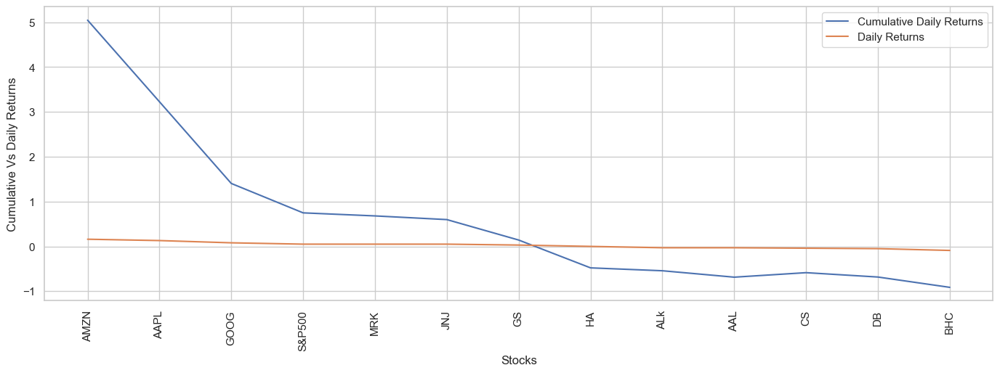

In [56]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Avg Daily Returns'], label="Daily Returns")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Vs Daily Returns")

plt.show()

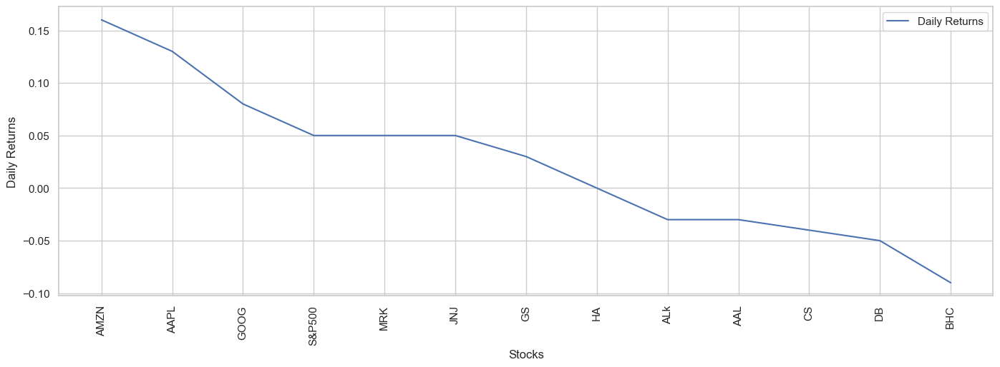

In [57]:
# Line chart showing daily returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Avg Daily Returns'], label="Daily Returns")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Daily Returns")

plt.show()

### Insight:
- We can see that Apple, Amazon, Alphabat have given better daily returns.

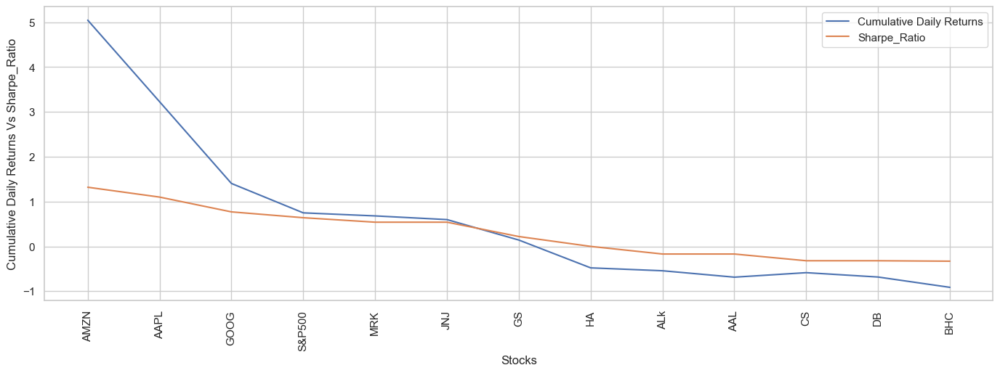

In [58]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Sharpe_Ratio'], label="Sharpe_Ratio")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio")

plt.show()

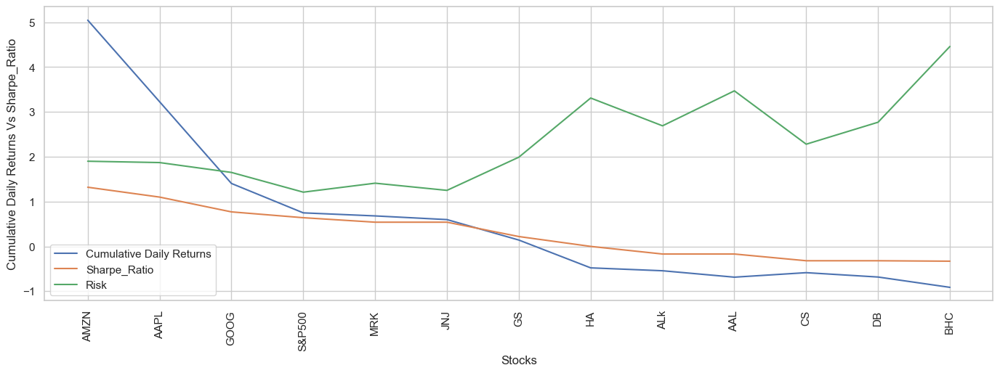

In [59]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Sharpe_Ratio'], label="Sharpe_Ratio")
#sns.lineplot(data=df_final['Annualized_Risk'], label="Annualized_Risk")
sns.lineplot(data=df_final['Risk'], label="Risk")


# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio")

plt.show()

# Portfolio Analysis

MS Alexendra wants to double her investment in the span on 5 years. She wants to invest in low risk stocks which would fetch her decent returns.
As per her profile Low risk stocks like JNJ ,MRK and GOOG is suitable to invest on. But overall returns with these three stocks wouldn't reach the target what Ms Alexendra is investing for. So one portion of her wealth can be invested on AMZN to gain the desired returns.

Lets calculate the Risk and Returns associated with the above mentioned portfolio

In [60]:
# Initial weight for each stock in order
stocks = ['JNJ' ,'MRK','GOOG','AMZN']

initial_weight = np.array([0.25, 0.25, 0.25, 0.25])

In [61]:
# Lets create a dataset for selected stocks
portfolio = data.copy()
portfolio = portfolio[stocks]

In [62]:
portfolio.tail()

,JNJ,MRK,GOOG,AMZN
Date,,,,
2020-09-24,144.669998,83.150002,1428.290039,3019.790039
2020-09-25,145.660004,82.930000,1444.959961,3095.129883
2020-09-28,147.110001,82.760002,1464.520020,3174.050049
2020-09-29,147.059998,81.900002,1469.329956,3144.879883
2020-09-30,148.880005,82.949997,1469.599976,3148.729980


## Daily return from each stock

Daily return is the percentage change in the price of the stock from the previous day. This can be calculated using the percentage change in the price on a daily basis

In [63]:
# Daily return from each stock 
stocks_returns = portfolio.pct_change()
stocks_returns.head(8)

,JNJ,MRK,GOOG,AMZN
Date,,,,
2015-10-01,NaN,NaN,NaN,NaN
2015-10-02,0.008157,0.015597,0.025553,0.022699
2015-10-05,0.008836,0.021739,0.023225,0.020919
2015-10-06,-0.014141,-0.027913,0.006189,-0.011404
2015-10-07,0.016699,0.023092,-0.004772,0.008298
2015-10-08,0.001053,0.001374,-0.004982,-0.016201
2015-10-09,0.003050,-0.001372,0.006962,0.012454
2015-10-12,0.006501,-0.004711,0.004754,0.019248


## Average daily return from each stock

In [64]:
# Average daily return from each stock
mean_stocks_daily_returns = stocks_returns.mean()
print(mean_stocks_daily_returns)

JNJ     0.000451
MRK     0.000511
GOOG    0.000834
AMZN    0.001611
dtype: float64


AMZN seems to be the best performer.

# Risk of Stocks in Portfolio

In [65]:
stock_risk = stocks_returns.std()
stock_risk

JNJ     0.012459
MRK     0.014067
GOOG    0.016520
AMZN    0.018969
dtype: float64

# Daily return from the portfolio

The weighted average can be calculated to determine the return from the portfolio on a daily basis.



In [66]:
# Portfolio daily returns
stocks_returns['portfolio_daily_returns'] = stocks_returns.dot(initial_weight)
stocks_returns

,JNJ,MRK,GOOG,AMZN,portfolio_daily_returns
Date,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.008157,0.015597,0.025553,0.022699,0.018001
2015-10-05,0.008836,0.021739,0.023225,0.020919,0.018680
2015-10-06,-0.014141,-0.027913,0.006189,-0.011404,-0.011817
2015-10-07,0.016699,0.023092,-0.004772,0.008298,0.010829
...,...,...,...,...,...
2020-09-24,0.001592,0.006293,0.009242,0.006644,0.005943
2020-09-25,0.006843,-0.002646,0.011671,0.024949,0.010204
2020-09-28,0.009955,-0.002050,0.013537,0.025498,0.011735


# Total Portfolio Return

In [67]:
# We are calculating the total portfolio return

allocated_stocks_daily_returns = (initial_weight * mean_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

0.08515944821952438

Average Daily Returns of Portfolio is 0.08%

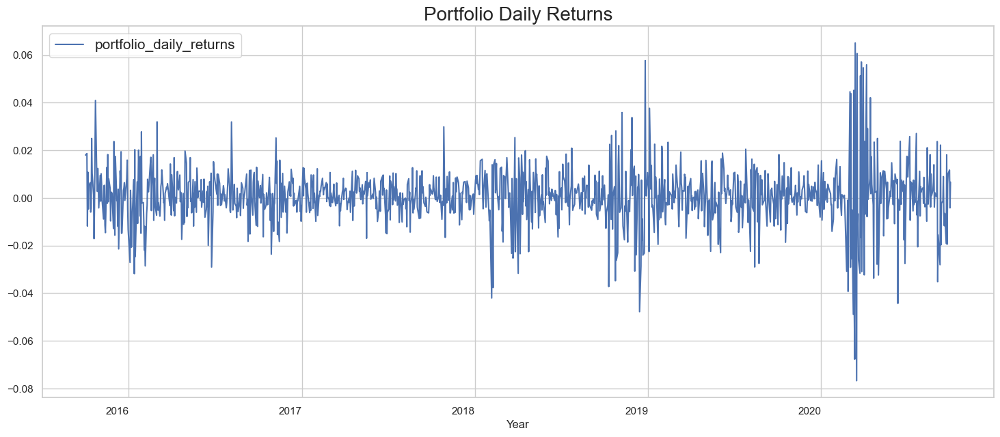

In [68]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
stocks_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 15)
plt.xticks(rotation=0)
plt.xlabel("Year")
plt.show()

As seen in the plot, the portfolio shows larger variation in prices from 2018 to 2019. 

# Cumulative return from the Portfolio

In [69]:
# Cumulative return from the portfolio

daily_cumulative_returns = (1+stocks_returns).cumprod()
daily_cumulative_returns.tail(5)

,JNJ,MRK,GOOG,AMZN,portfolio_daily_returns
Date,,,,,
2020-09-24,1.552753,1.684221,2.336518,5.799259,2.603462
2020-09-25,1.563379,1.679765,2.363788,5.943943,2.630028
2020-09-28,1.578942,1.676322,2.395786,6.095503,2.660892
2020-09-29,1.578405,1.658902,2.403655,6.039484,2.649824
2020-09-30,1.597939,1.680170,2.404096,6.046878,2.667448


This suggests that the portfolio has achieved a cumulative return of 1.11% in the given period

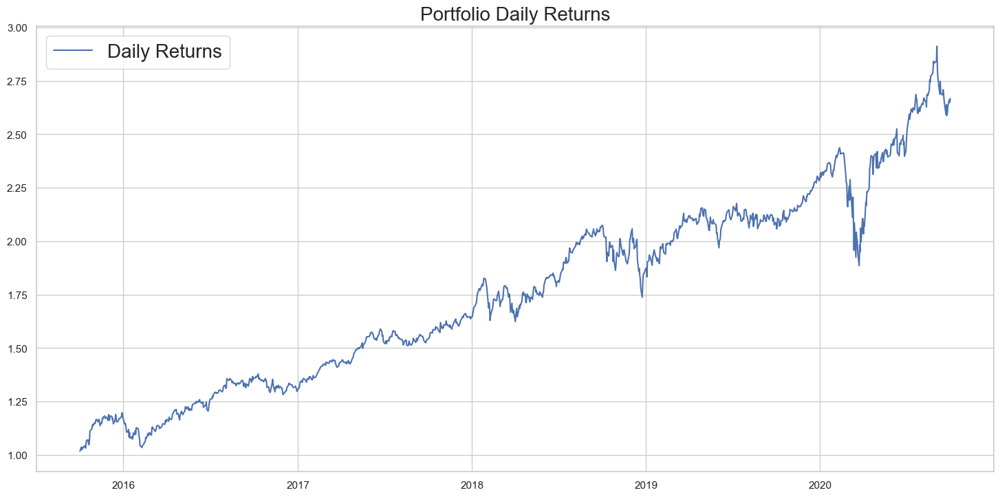

In [70]:
# Lets Plot the graph

plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_returns['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 20)
plt.show()

 # Portfolio Risk – Portfolio Standard Deviation

For the portfolio standard deviation formula, we need three elements:

- Portfolio weight array
- Portfolio covariance matrix
- Transpose of portfolio weight array

The weight for each stock in the portfolio is already available. We need to calculate the daily covariance. Remember, the covariance must be annualised by multiplying with 252 (the trading days in a year)

In [71]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = stocks_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,JNJ,MRK,GOOG,AMZN
JNJ,0.039117,0.025844,0.023301,0.019497
MRK,0.025844,0.049865,0.023880,0.017194
GOOG,0.023301,0.023880,0.068777,0.053907
AMZN,0.019497,0.017194,0.053907,0.090671


In [72]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

In [73]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

18.968336348910267

### Sharpe Ratio

In [74]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (stocks_returns['portfolio_daily_returns'].mean() - daily_returns['S&P500'].mean()) / stocks_returns['portfolio_daily_returns'].std()
Sharpe_Ratio

0.027961344528030712

In [75]:
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

0.4438725836649959

## Total ROI from the Portfolio

In [76]:
invested_amount=1000000
Cummulative_returns=daily_cumulative_returns['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

2667448.3989047217

In [77]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

1667448.3989047217

If Ms Alexendra invests 1 Million Dollar on equities i.e the above Portfolio. Returns that he would fetch after 5 years is more than 2 million dollers with 1+ million dollors of gain

# Capital Assest Pricing Model

In [78]:
# joining the two datasets 
prices = pd.concat([AMZN['AMZN'], SP500['S&P500'], JNJ['JNJ'], MRK['MRK'], GOOG['GOOG']], axis=1)
prices.columns = ['AMZN', 'S&P500', 'JNJ', 'MRK', 'GOOG']

In [79]:
# Calculating the daily returns
returns = prices.pct_change(1)

# Dropping the rows with missing values
returns = returns.dropna(axis=0)
returns.head()

,AMZN,S&P500,JNJ,MRK,GOOG
1,0.010930,-0.008035,-0.001296,-0.002186,-0.006221
2,0.035266,0.020861,0.018323,0.013691,0.030401
3,-0.034003,-0.000672,0.006529,-0.000270,-0.007209
4,0.005599,-0.001647,0.000158,-0.008106,-0.008122
5,-0.004607,0.006122,0.000158,0.005448,0.011962


In [80]:
# Plotting the series to understand the correlation
returns.plot()

<Axes: >

In [81]:
# Average daily return from each stock
daily_returns_mean = returns.mean()
print(daily_returns_mean)

AMZN      0.001393
S&P500    0.000486
JNJ       0.000407
MRK       0.000409
GOOG      0.000815
dtype: float64


In [82]:
# Cumulative Return for an investor if he/she bought the stocks on 2013-01-07 (7th January 2013)
new = returns.loc["2013-01-07":, :]

# Cumulative return from the portfolio
cumulative_returns = (1+new).cumprod()
cumulative_returns.tail(5)

,AMZN,S&P500,JNJ,MRK,GOOG
2520,1.57094,1.149905,1.065789,1.159653,1.229472
2521,1.57094,1.149905,1.065789,1.159653,1.229472
2522,1.57094,1.149905,1.065789,1.159653,1.229472
2523,1.57094,1.149905,1.065789,1.159653,1.229472
2524,1.57094,1.149905,1.065789,1.159653,1.229472


## CAPM for amazon

In [103]:
# spllitting the data into dependent variable (Return on security) and independent variable (Return on market benchmark) 
AMZN = returns['AMZN']
SP500 = returns['S&P500']

In [104]:
# Adding a constant for the regression equation
X = sm.add_constant(SP500)

In [110]:
# make regression model 
model = sm.OLS(AMZN,X)

In [111]:
# Printing results to extract the values
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   AMZN   R-squared:                       0.302
Model:                            OLS   Adj. R-squared:                  0.301
Method:                 Least Squares   F-statistic:                     1089.
Date:                Mon, 24 Jun 2024   Prob (F-statistic):          8.97e-199
Time:                        14:10:46   Log-Likelihood:                 6763.9
No. Observations:                2524   AIC:                        -1.352e+04
Df Residuals:                    2522   BIC:                        -1.351e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0009      0.000      2.743      0.0

In [112]:
# Regression Equation
print("constant: " + str(results.params[0]))
print("Beta: " + str(results.params[1]))

print("\nEquation: " + "(Ri - Rf) = " + str(results.params[0]) + " + " + str(results.params[1]) + " * (Rm - Rf)" )

constant: 0.0009073573138313295
Beta: 0.9988141028382775

Equation: (Ri - Rf) = 0.0009073573138313295 + 0.9988141028382775 * (Rm - Rf)


## CAPM for JNJ

In [113]:
# spllitting the data into dependent variable (Return on security) and independent variable (Return on market benchmark) 
JNJ = returns['JNJ']
SP500 = returns['S&P500']

In [114]:
# Adding a constant for the regression equation
X = sm.add_constant(SP500)

In [115]:
# make regression model 
model = sm.OLS(JNJ, X)

In [116]:
# Printing results to extract the values
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                    JNJ   R-squared:                       0.446
Model:                            OLS   Adj. R-squared:                  0.445
Method:                 Least Squares   F-statistic:                     2027.
Date:                Mon, 24 Jun 2024   Prob (F-statistic):               0.00
Time:                        14:11:50   Log-Likelihood:                 8585.9
No. Observations:                2524   AIC:                        -1.717e+04
Df Residuals:                    2522   BIC:                        -1.716e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       8.535e-05      0.000      0.531      0.5

In [117]:
# Regression Equation
print("constant: " + str(results.params[0]))
print("Beta: " + str(results.params[1]))

print("\nEquation: " + "(Ri - Rf) = " + str(results.params[0]) + " + " + str(results.params[1]) + " * (Rm - Rf)" )

constant: 8.534985161013549e-05
Beta: 0.6622340924233237

Equation: (Ri - Rf) = 8.534985161013549e-05 + 0.6622340924233237 * (Rm - Rf)


## CAPM for MRK

In [118]:
# spllitting the data into dependent variable (Return on security) and independent variable (Return on market benchmark) 
MRK = returns['MRK']
SP500 = returns['S&P500']

In [119]:
# Adding a constant for the regression equation
X = sm.add_constant(SP500)

In [120]:
# make regression model 
model = sm.OLS(MRK, X)

In [121]:
# Printing results to extract the values
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                    MRK   R-squared:                       0.378
Model:                            OLS   Adj. R-squared:                  0.378
Method:                 Least Squares   F-statistic:                     1531.
Date:                Mon, 24 Jun 2024   Prob (F-statistic):          3.98e-262
Time:                        14:12:20   Log-Likelihood:                 7973.6
No. Observations:                2524   AIC:                        -1.594e+04
Df Residuals:                    2522   BIC:                        -1.593e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.219e-05      0.000      0.255      0.7

In [122]:
# Regression Equation
print("constant: " + str(results.params[0]))
print("Beta: " + str(results.params[1]))

print("\nEquation: " + "(Ri - Rf) = " + str(results.params[0]) + " + " + str(results.params[1]) + " * (Rm - Rf)" )

constant: 5.218599311787123e-05
Beta: 0.7334761646325813

Equation: (Ri - Rf) = 5.218599311787123e-05 + 0.7334761646325813 * (Rm - Rf)


## CAPM for GOOG

In [123]:
# spllitting the data into dependent variable (Return on security) and independent variable (Return on market benchmark) 
GOOG = returns['GOOG']
SP500 = returns['S&P500']

In [124]:
# Adding a constant for the regression equation
X = sm.add_constant(SP500)

In [125]:
# make regression model 
model = sm.OLS(GOOG, X)

In [126]:
# Printing results to extract the values
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   GOOG   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     2172.
Date:                Mon, 24 Jun 2024   Prob (F-statistic):               0.00
Time:                        14:12:37   Log-Likelihood:                 7599.4
No. Observations:                2524   AIC:                        -1.519e+04
Df Residuals:                    2522   BIC:                        -1.518e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0003      0.000      1.356      0.1

In [127]:
# Regression Equation
print("constant: " + str(results.params[0]))
print("Beta: " + str(results.params[1]))

print("\nEquation: " + "(Ri - Rf) = " + str(results.params[0]) + " + " + str(results.params[1]) + " * (Rm - Rf)" )

constant: 0.00032205840859416703
Beta: 1.0133422115578279

Equation: (Ri - Rf) = 0.00032205840859416703 + 1.0133422115578279 * (Rm - Rf)


# Conclusion:


1. In this Notebook we have explored stock prices of tech stocks, pharma stocks, Aviation stocks, finance stocks & market Index also. We have looked at the historical price of stock price.We have looked at the volume of stock traded.


2. We have looked at the daily Return of stock.We have done correlation between the stock prices. Amazon have highest daily price correlation.In stock exchange there is a limit on per day fluctuation of stock.So if the stock reaches the threshold value then the trading of the stock is stopped for that day.


3. Stock with Low risk and high return are the best stock to buy. We can see that Amazon Stock has high risk and high returns.